# EM, PPCA, PCA.

Библиотеки.

In [ ]:
import numpy as np
from scipy import stats as sps
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.datasets import fetch_lfw_people

from tqdm import tqdm

from typing import List, Tuple

## EM алгоритм.

### Интуиция.

In [ ]:
mu_1 = 64
sigma_1 = 4
N_1 = 6000

mu_2 = 52
sigma_2 = 2
N_2 = 4000

Данные для эксперимента.

In [ ]:
distribution_1 = sps.norm(loc=mu_1, scale=sigma_1)
distribution_2 = sps.norm(loc=mu_2, scale=sigma_2)

distributions = [distribution_1, distribution_2]
N = np.array([N_1, N_2])

samples = [distribution.rvs(size=n) for n, distribution in zip(N, distributions)]
sample = np.concatenate(samples, axis=0)

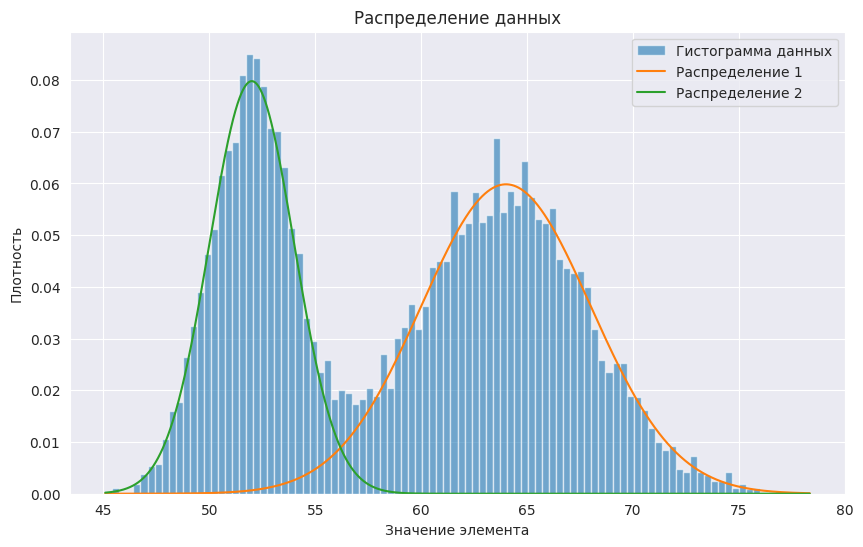

In [ ]:
with sns.axes_style("darkgrid"):
    plt.figure(figsize=(10, 6))
    plt.hist(sample, bins=100, density=True, alpha=0.6, label="Гистограмма данных")

    x = np.linspace(np.min(sample), np.max(sample), 10**5)

    for i in range(len(distributions)):
        ratio = N[i] / (N_1 + N_2)
        plt.plot(x, distributions[i].pdf(x) * ratio, label=f"Распределение {i + 1}")

    plt.xlabel("Значение элемента")
    plt.ylabel("Плотность")
    plt.title("Распределение данных")
    plt.legend()

    plt.show()

Мы видим, что исходное распределение данных состоит из двух различных компонент. Это говорит о том, что данные могут быть описаны смесью двух распределений.

Для решения этой задачи хорошо подходит EM-алгоритм (Expectation-Maximization).

EM-алгоритм работает итеративно, чередуя два шага:

*    E-шаг (Expectation): Оценка вероятностей принадлежности каждой точки к каждому из распределений.

*   M-шаг (Maximization): Обновление параметров распределений на основе текущих вероятностей.

**E шаг:**

$$
P(B_i | X_j) = \frac{P(X_j | B_i) \cdot P(B_i)}{\sum_k P(X_j | B_k) \cdot P(B_k)}
$$

In [ ]:
def posterior_probabilities(likelihood_Bi, prior_Bi):
    """
    Вычисляет апостериорные вероятности P(B_i | X_j).

    Параметры:
    likelihood_Bi (np.array): Вероятности P(X_j | B_i) для каждого i и j.
                              Размерность: (n_components, n_samples) или (n_samples, n_components).
    prior_Bi (np.array): Априорные вероятности P(B_i).
                         Размерность: (n_components,).

    Возвращает:
    np.array: Апостериорные вероятности P(B_i | X_j).
              Размерность: (n_components, n_samples).
    """
    # P(X_j | B_i) * P(B_i)
    numerator = likelihood_Bi * prior_Bi[:, np.newaxis]

    # sum P(X_j | B_k) * P(B_k) for all k
    denominator = np.sum(numerator, axis=0)

    posterior_Bi = numerator / denominator
    return posterior_Bi

Тут:
$$
P(B_i) = \frac{N_i}{N_1 + N_2}
$$
$$
P(X_j | B_i) = f_{B_i}(X_j), \ \ \text{ тут } f_{B_i} \text{ плотность i-того распределения }
$$

In [ ]:
prior_Bi = N / np.sum(N)
likelihood_Bi = np.array([distribution.pdf(sample) for distribution in distributions])
posterior_Bi = posterior_probabilities(likelihood_Bi, prior_Bi)

**M шаг**:

In [ ]:
thresholds = [0.5, 0.5]
prediction_distrib = [posterior_Bi[i] > threshold for i, threshold in enumerate(thresholds)]

Посчитаем точность предсказания.

In [ ]:
true_1 = np.concatenate([np.ones(N_1), np.zeros(N_2)]).astype(bool)
true_2 = np.concatenate([np.zeros(N_1), np.ones(N_2)]).astype(bool)
true = [true_1, true_2]

[accuracy_score(true[i], prediction_distrib[i]) for i in range(len(true))]

[0.976, 0.976]

Визуализируем.

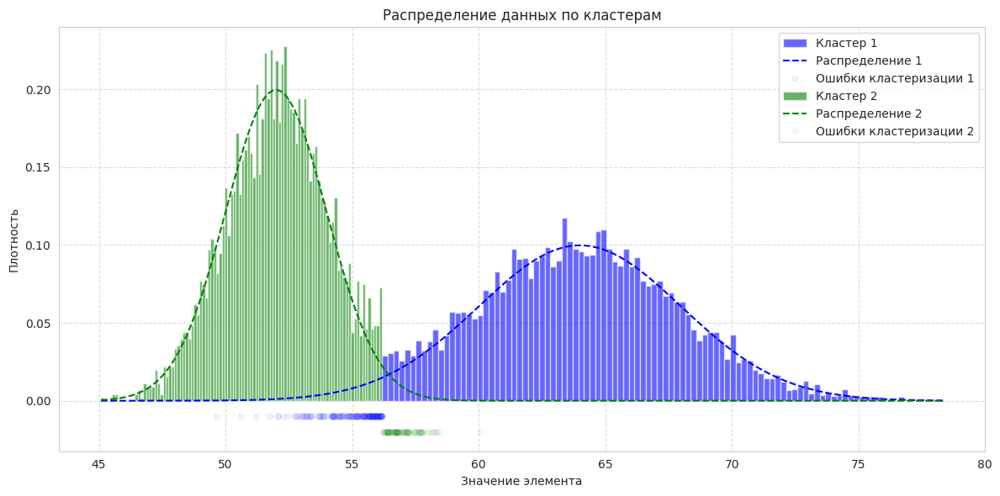

In [ ]:
with sns.axes_style("whitegrid"):
    plt.figure(figsize=(12, 6))
    dist_colors = ['blue', 'green']
    x = np.linspace(np.min(sample), np.max(sample), 10**4)

    for i, prediction in enumerate(prediction_distrib):
        plt.hist(
            sample[prediction], bins=100, density=True, alpha=0.6,
            color=dist_colors[i], label=f"Кластер {i + 1}"
        )

        plt.plot(
            x, distributions[i].pdf(x),
            color=dist_colors[i], linestyle='--',
            label=f"Распределение {i + 1}"
        )

        xor_result = np.logical_xor(true[i], prediction)
        final_condition = np.logical_and(xor_result, true[i])
        errors = sample[final_condition]

        plt.plot(
            errors, -(i + 1) / 100 + np.zeros_like(errors), 'o', markersize=5,
            color=dist_colors[i], alpha=0.05, label=f"Ошибки кластеризации {i + 1}"
        )

    plt.xlabel("Значение элемента")
    plt.ylabel("Плотность")
    plt.title("Распределение данных по кластерам")
    plt.legend()

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

### Общии случай для Гауссовой смеси.

#### Реализация EM алгоритма для разделения Гауссовской смеси.

**Модель:**  
Предположим, что наблюдения $x_1, x_2, \dots, x_N$ генерируются из смеси $K$ гауссовских распределений. Тогда плотность распределения для одного наблюдения имеет вид:
$$
p(x_i \mid \Theta) = \sum_{k=1}^{K} \pi_k \, \mathcal{N}(x_i \mid \mu_k, \Sigma_k),
$$
где:
- $\pi_k$ - **смешивающие коэффициенты** (априорные вероятности): $\pi_k \ge 0$ и $\sum_{k=1}^{K} \pi_k = 1$.
- $\mu_k$ - вектор среднего для $k$-ой компоненты.
- $\Sigma_k$ - ковариационная матрица $k$-ой компоненты.
- $\Theta = \{\pi_k,\, \mu_k,\, \Sigma_k\}_{k=1}^{K}$ - совокупность всех параметров модели.

**Латентные переменные:**  
Введём скрытые (латентные) переменные $z_i$ в виде индикаторных переменных, где
$$
z_{ik} = \begin{cases} 1, & \text{если } x_i \text{ сгенерировано компонентой } k, \\ 0, & \text{иначе.} \end{cases}
$$
Совместная (полная) вероятность для наблюдения и его латентной метки:
$$
p(x_i, z_i \mid \Theta) = \prod_{k=1}^{K} \left[\pi_k \, \mathcal{N}(x_i \mid \mu_k, \Sigma_k)\right]^{z_{ik}}.
$$

**Полное логарифмическое правдоподобие:**  
Для всего набора данных $X = \{x_1,\dots,x_N\}$ и латентных переменных $Z = \{z_1,\dots,z_N\}$ имеем:
$$
\ln p(X, Z \mid \Theta) = \sum_{i=1}^{N} \sum_{k=1}^{K} z_{ik} \left[\ln \pi_k + \ln \mathcal{N}(x_i \mid \mu_k, \Sigma_k)\right].
$$



**E-шаг:**

На этом шаге вычисляем апостериорные вероятности для каждой компоненты:
$$
\gamma(z_{ik}) = p(z_{ik}=1 \mid x_i, \Theta^{(t)}) = \frac{\pi_k^{(t)} \, \mathcal{N}(x_i \mid \mu_k^{(t)}, \Sigma_k^{(t)})}{\sum_{j=1}^{K} \pi_j^{(t)} \, \mathcal{N}(x_i \mid \mu_j^{(t)}, \Sigma_j^{(t)})}.
$$
Величину $\gamma(z_{ik})$ интерпретируют как 'мягкие' метки принадлежности $x_i$ к компоненте $k$.

**M-шаг:**

В M-шаге обновляем оценки параметров, максимизируя ожидаемое полное логарифмическое правдоподобие:
$$
Q(\Theta, \Theta^{(t)}) = \sum_{i=1}^{N} \sum_{k=1}^{K} \gamma(z_{ik}) \left[\ln \pi_k + \ln \mathcal{N}(x_i \mid \mu_k, \Sigma_k)\right].
$$

При оптимизации получаем следующие обновления:

1. Обновление смешивающих коэффициентов:
   $$
   N_k = \sum_{i=1}^{N} \gamma(z_{ik}),
   $$
   $$
   \pi_k^{(t+1)} = \frac{N_k}{N}.
   $$

2. Обновление средних:
   $$
   \mu_k^{(t+1)} = \frac{1}{N_k} \sum_{i=1}^{N} \gamma(z_{ik}) \, x_i.
   $$

3. Обновление ковариационных матриц:
   $$
   \Sigma_k^{(t+1)} = \frac{1}{N_k} \sum_{i=1}^{N} \gamma(z_{ik}) \, \left(x_i - \mu_k^{(t+1)}\right)\left(x_i - \mu_k^{(t+1)}\right)^{T}.
   $$

In [ ]:
class GaussianMixtureEM:
    def __init__(self, n_components, max_iter=100, random_state=None):
        self.n_components = n_components
        self.max_iter = max_iter
        self.random_state = random_state

        # Параметры модели: смешивающие коэффициенты, средние и ковариации
        self.pi = None      # shape: (K,)
        self.mu = None      # shape: (K, d)
        self.cov = None     # shape: (K, d, d)

    def _initialize_parameters(self, X):
        np.random.seed(self.random_state)

        N, d = X.shape
        K = self.n_components

        self.pi = np.ones(K) / K

        indices = np.random.choice(N, K, replace=False)
        self.mu = X[indices]

        if d == 1:
            self.cov = np.var(X, axis=0) * np.ones(K)
        else:
            self.cov = np.array([np.cov(X, rowvar=False)] * K)

    def _E_step(self, X):
        """
        Вычисляет responsibilities: gamma[i,k] = p(z_i=k|x_i, theta)
        X.shape: (N, d)
        gamma.shape:  (N, K)
        """
        N, d = X.shape
        K = self.n_components
        gamma = np.zeros((N, K))

        for k in range(K):
            if d == 1:
                gamma[:, k] = self.pi[k] * sps.norm(self.mu[k], np.sqrt(self.cov[k])).pdf(X[:, 0])
            else:
                gamma[:, k] = self.pi[k] * sps.multivariate_normal(self.mu[k], self.cov[k]).pdf(X)

        gamma_sum = np.sum(gamma, axis=1, keepdims=True)
        gamma /= gamma_sum
        return gamma

    def _M_step(self, X, gamma):
        """
        Обновляет параметры модели с использованием responsibilities.
        """
        N, d = X.shape
        K = self.n_components
        N_k = gamma.sum(axis=0)

        self.pi = N_k / N
        self.mu = (gamma.T @ X) / N_k[:, np.newaxis]

        if d == 1:
            self.cov = np.sum(gamma * (X[:, 0, np.newaxis] - self.mu.T) ** 2, axis=0) / N_k
        else:
            self.cov = np.array([(gamma[:, k][:, np.newaxis] * (X - self.mu[k])).T @ (X - self.mu[k]) / N_k[k]
                                 for k in range(K)])

    def fit(self, X, is_log=False):
        """
        Обучает модель на данных X с помощью EM-алгоритма.

        Если is_log=True, сохраняет и возвращает списки:
        - predict_proba_log: список матриц responsibilities (gamma) для каждой итерации;
        - predict_log: список векторов предсказанных меток (argmax по gamma) для каждой итерации.

        В противном случае возвращаются пустые списки.
        """
        # Если X одномерный (N,), приводим к форме (N, 1)
        if X.ndim == 1:
            X = X.reshape(-1, 1)

        self._initialize_parameters(X)

        predict_proba_log = []
        predict_log = []
        param_log = []

        for iteration in range(self.max_iter):
            # E-шаг: вычисляем responsibilities
            gamma = self._E_step(X)

            # M-шаг: обновляем параметры модели
            self._M_step(X, gamma)

            if is_log:
                predict_proba_log.append(gamma.copy())
                predict_log.append(np.argmax(gamma, axis=1).copy())
                param_log.append({
                    "mu": self.mu.copy(),
                    "cov": self.cov.copy(),
                    "pi": self.pi.copy(),
                })

        return predict_proba_log, predict_log, param_log

    def predict_proba(self, X):
        """
        Возвращает responsibilities для данных X.
        """
        if X.ndim == 1:
            X = X.reshape(-1, 1)
        return self._E_step(X)

    def predict(self, X):
        """
        Возвращает наиболее вероятную компоненту для каждого наблюдения.
        """
        if X.ndim == 1:
            X = X.reshape(-1, 1)
        gamma = self._E_step(X)
        return np.argmax(gamma, axis=1)

Класс для генерации смеси многомерных нормальных распределении.

In [ ]:
class GaussianMixtureGenerator:
    def __init__(self, distributions: List[Tuple[np.ndarray, np.ndarray, int]]):
        """
        Класс для генерации многомерных нормальных данных.

        :param distributions: Список кортежей (среднее, ковариационная матрица, количество точек)
        """
        self.distributions = [sps.multivariate_normal(mean=mu, cov=sigma) for mu, sigma, _ in distributions]
        self.sizes = [n for _, _, n in distributions]

    def sample(self) -> np.ndarray:
        """
        Генерирует выборку, объединяя данные из всех распределений.

        :return: np.ndarray формы (N, D), где N - суммарное число точек, D - размерность.
        """
        samples = [dist.rvs(size=n) for dist, n in zip(self.distributions, self.sizes)]
        return np.concatenate(samples, axis=0)

Красивый вывод результатов для двумерных данных.

In [ ]:
def beautiful_plot(predict, params, colors):
    with sns.axes_style("whitegrid"):
        for param, y_pred in zip(params, predict):
            plt.figure(figsize=(10, 6))

            for i in range(len(colors)):
                plt.scatter(sample[y_pred == i, 0],
                            sample[y_pred == i, 1],
                            s=10,
                            alpha=0.6,
                            color=colors[i],
                            label=f'Кластер {i + 1}')

            for i in range(len(colors)):
                plt.scatter(param["mu"][i, 0], param["mu"][i, 1],
                            s=200,
                            marker='o',
                            color='red',
                            edgecolor='black',
                            linewidth=1.5,
                            label=f'Mu {i + 1}')

            plt.xlabel('x')
            plt.ylabel('y')

            plt.legend()
            plt.show()

#### Пример 1.

Данные для эксперимента.

In [ ]:
params = [
    (np.array([64, 14]), np.diag([4, 1]), 6000),
    (np.array([52, 10]), np.diag([2, 1]), 4000)
]

generator = GaussianMixtureGenerator(params)
sample = generator.sample()

Запуск EM алгоритма.

In [ ]:
em = GaussianMixtureEM(n_components=2, max_iter=10, random_state=42)
_, predict, params = em.fit(sample, is_log=True)

Вывод результатов.

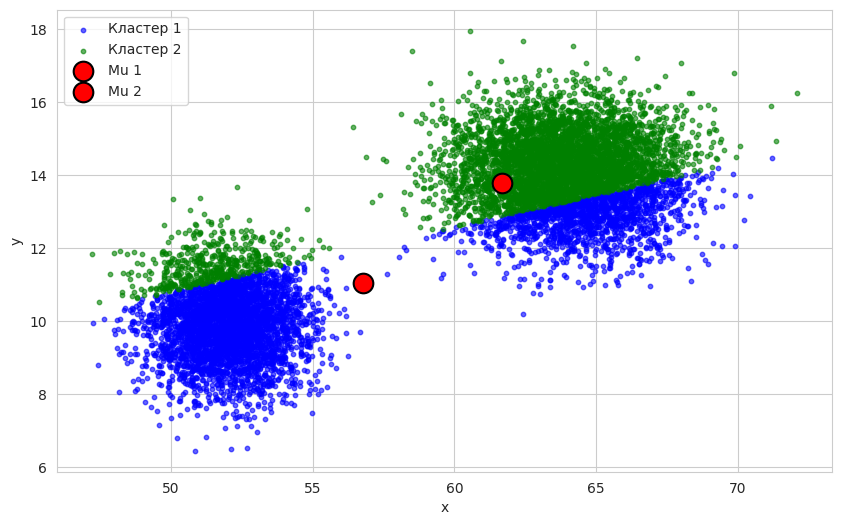

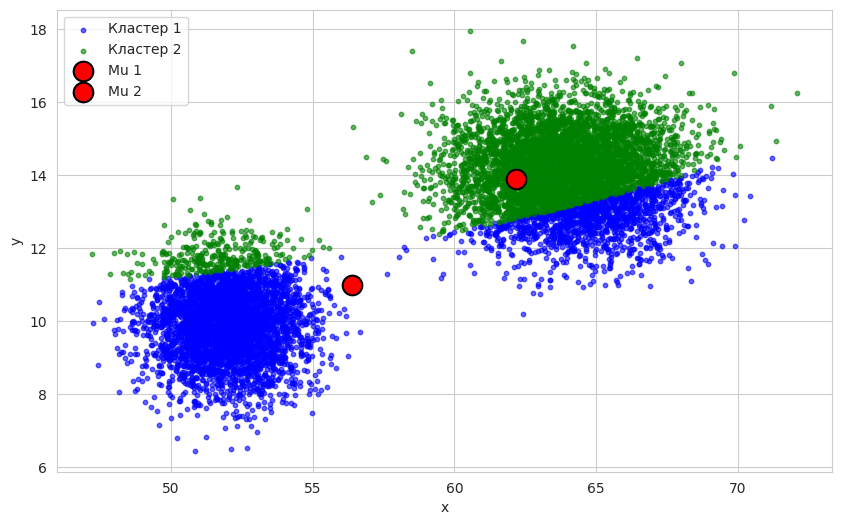

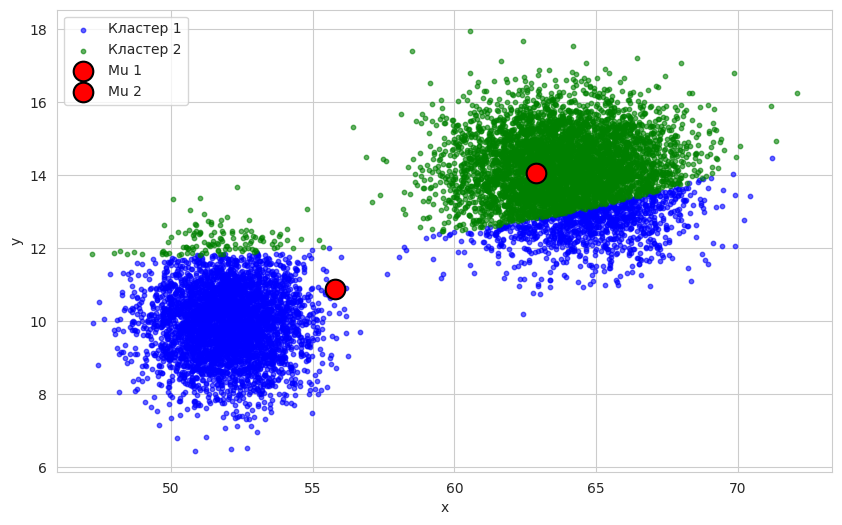

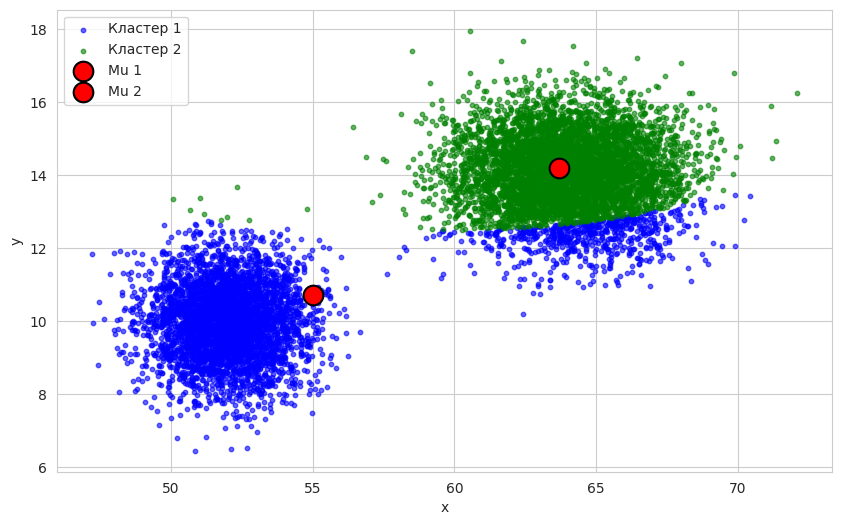

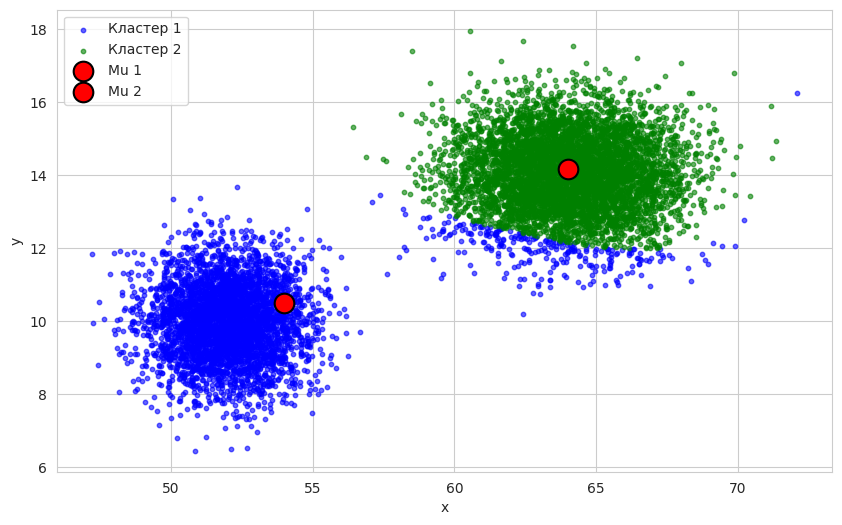

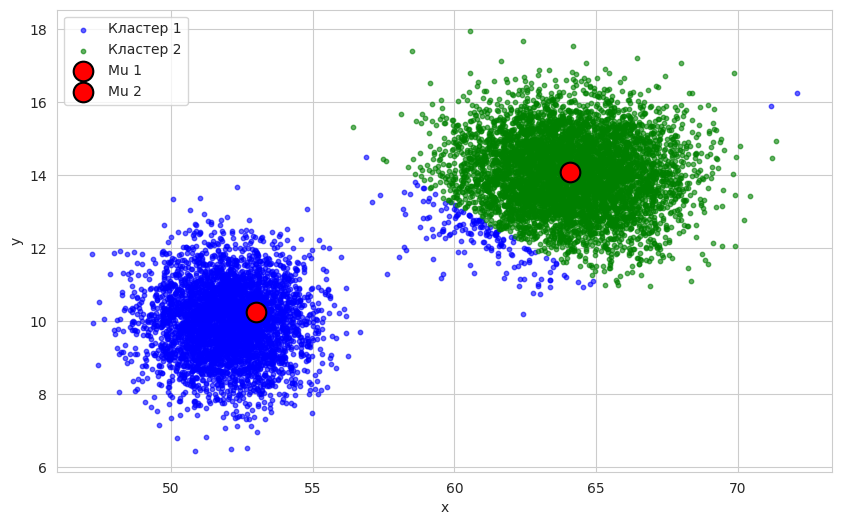

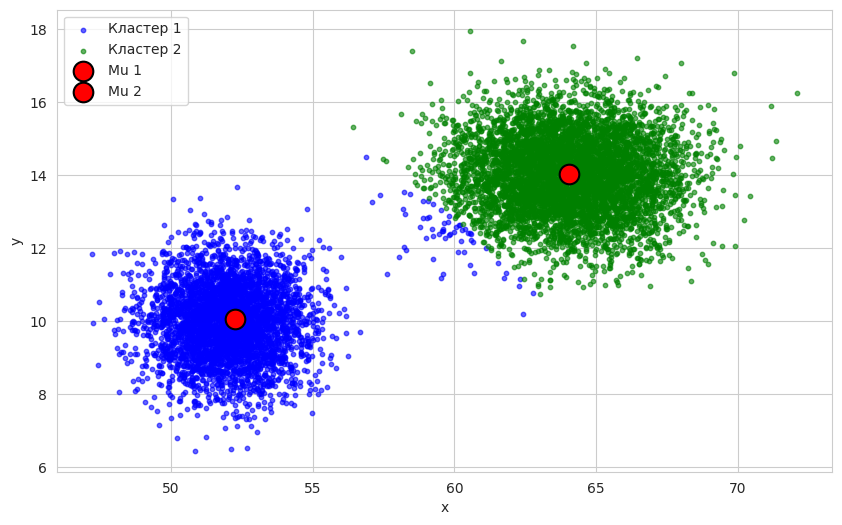

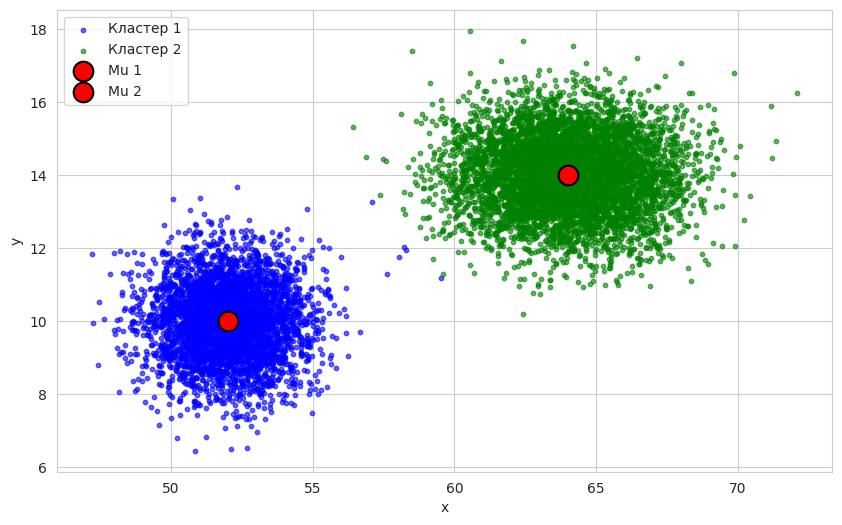

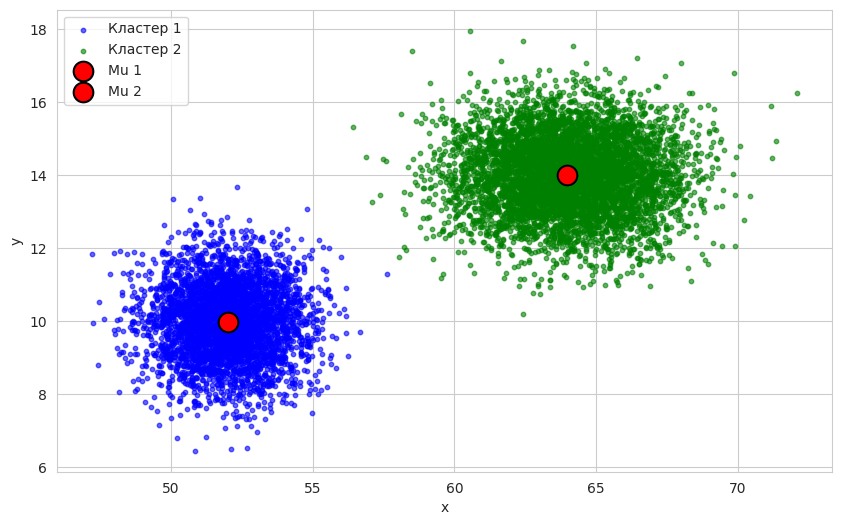

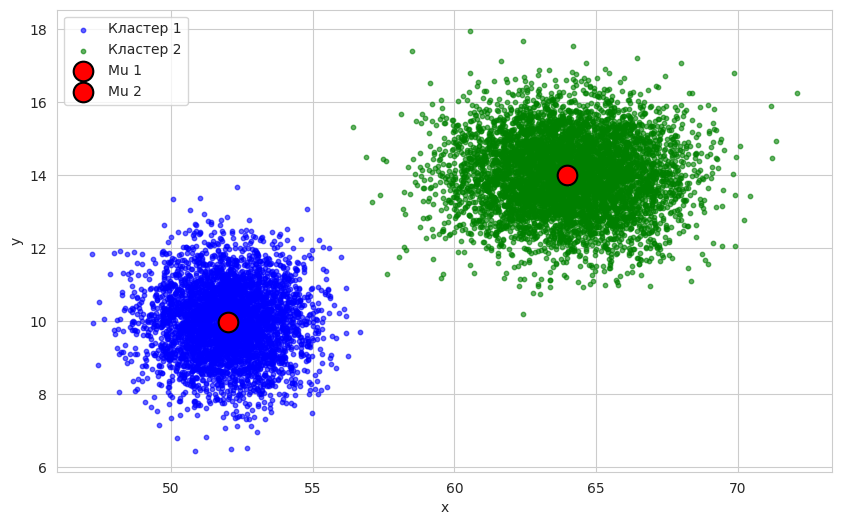

In [ ]:
beautiful_plot(predict, params, ['blue', 'green'])

#### Пример 2.

Данные для эксперимента.

In [ ]:
params = [
    (np.array([64, 14]), np.diag([4, 1]), 6000),
    (np.array([52, 10]), np.diag([2, 1]), 4000),
    (np.array([60, 8]), np.diag([1, 3]), 5000),
]

generator = GaussianMixtureGenerator(params)
sample = generator.sample()

Запуск EM алгоритма.


In [ ]:
em = GaussianMixtureEM(n_components=3, max_iter=10, random_state=42)
_, predict, params = em.fit(sample, is_log=True)

Вывод результатов.

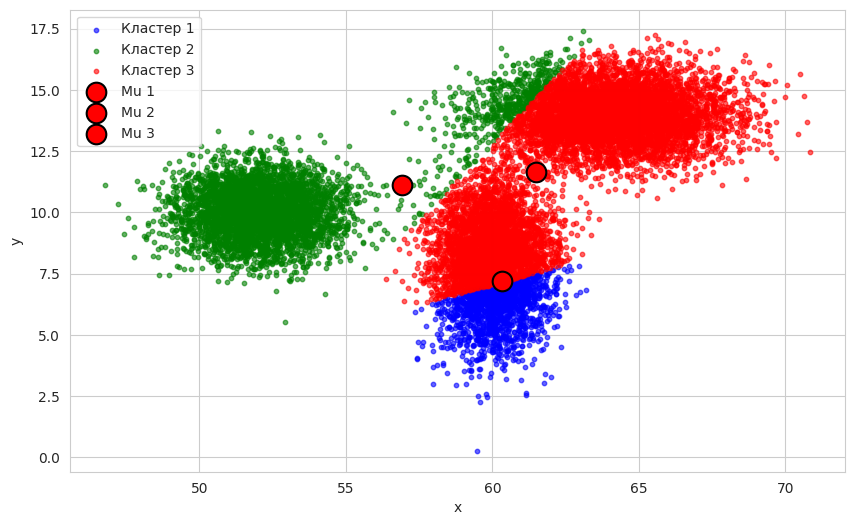

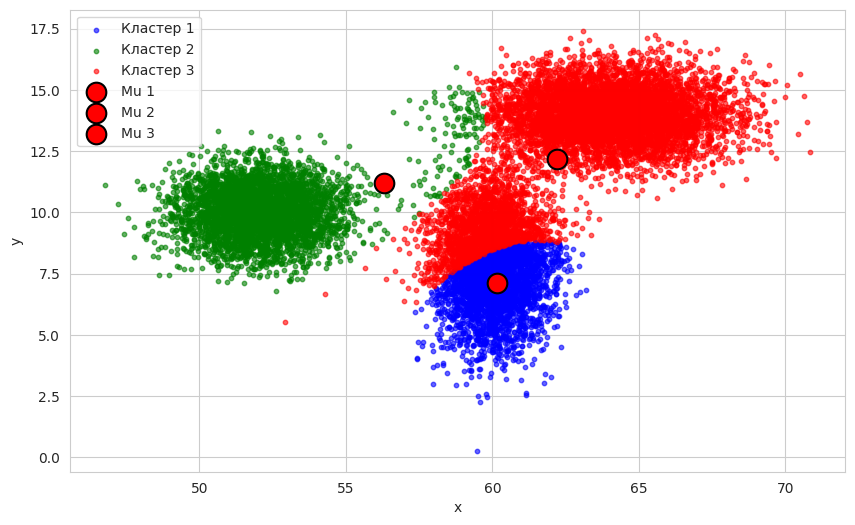

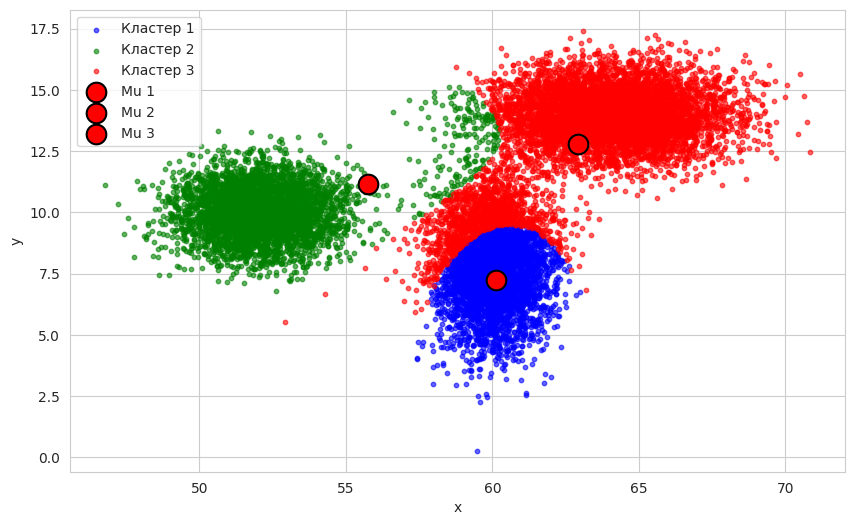

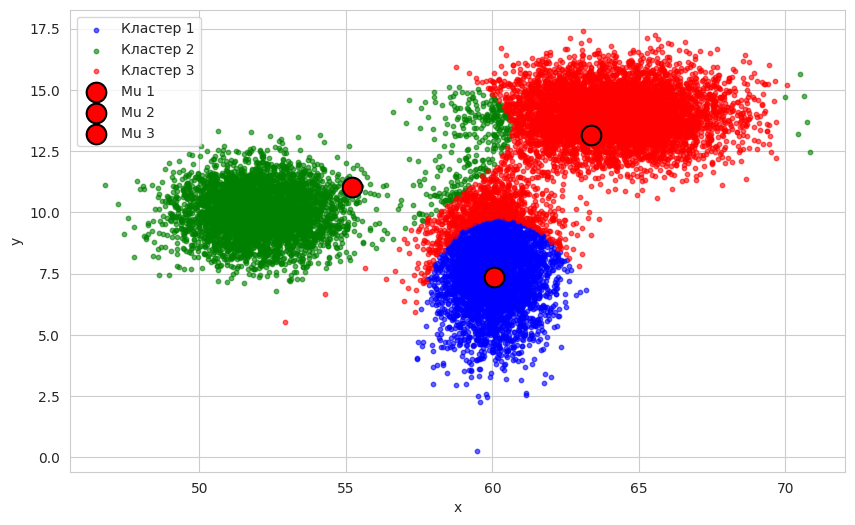

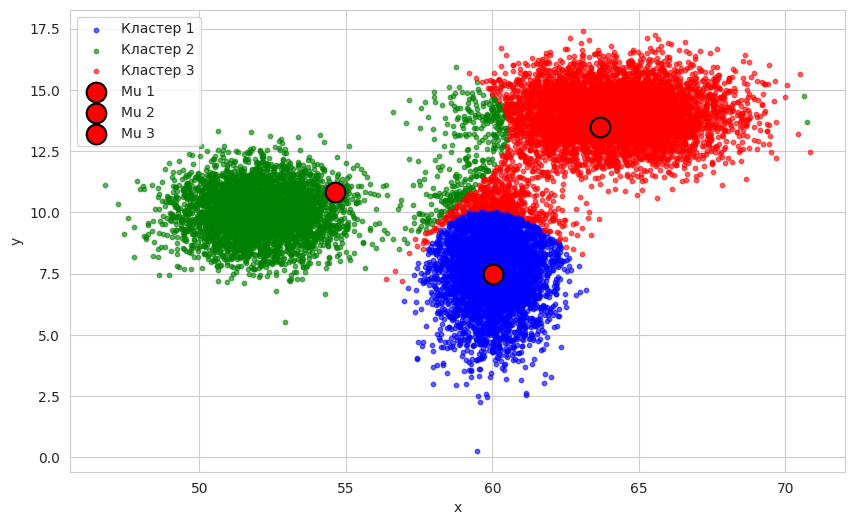

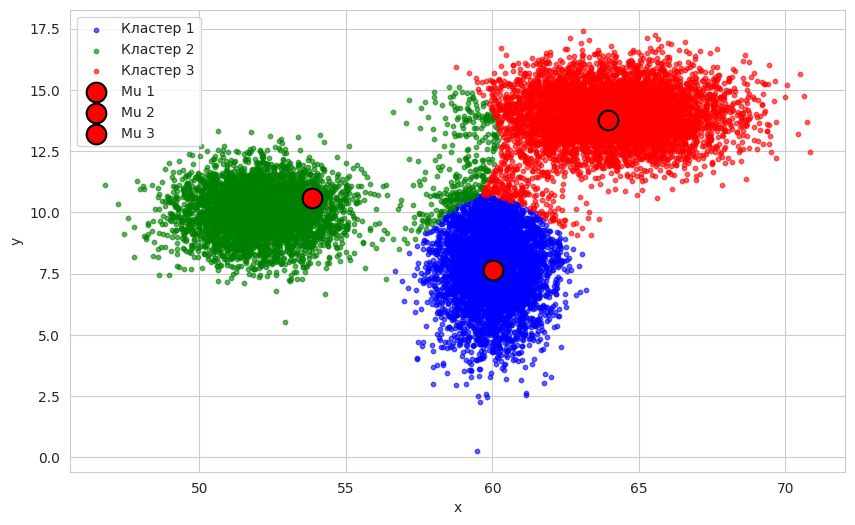

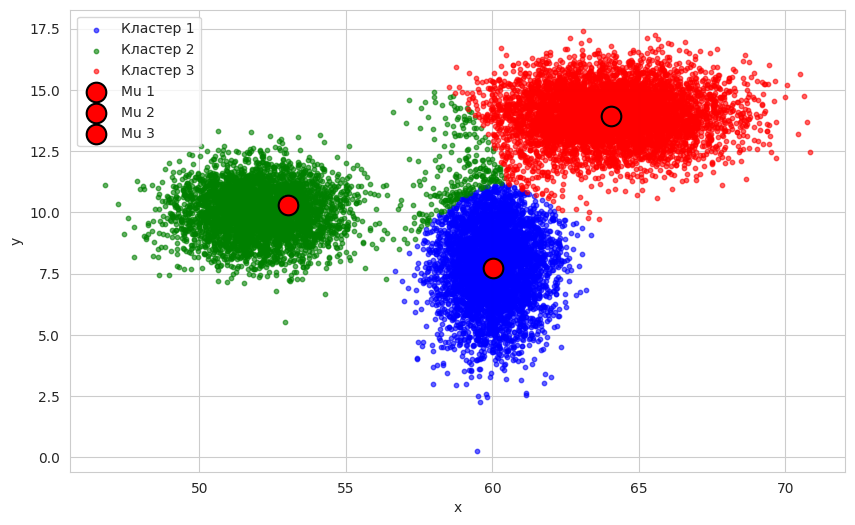

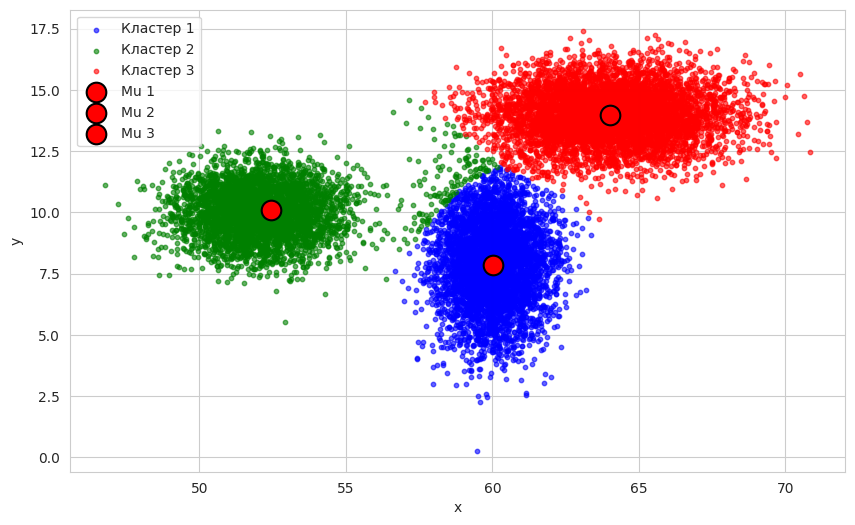

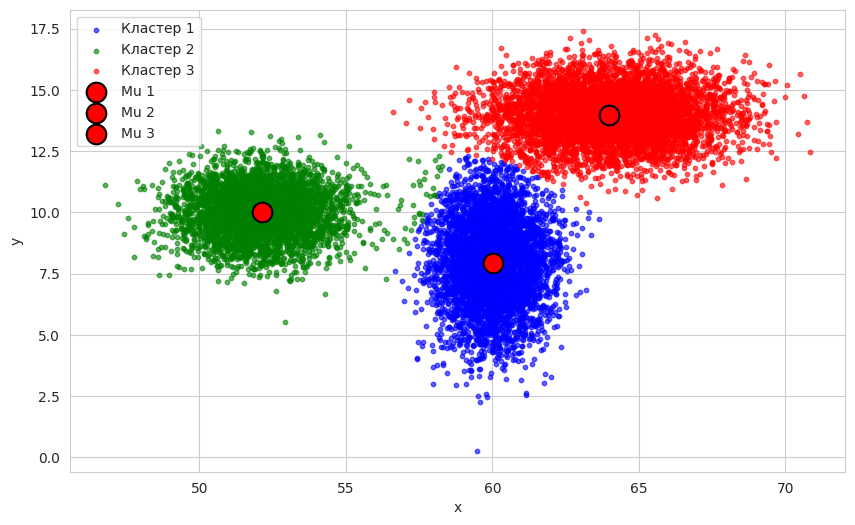

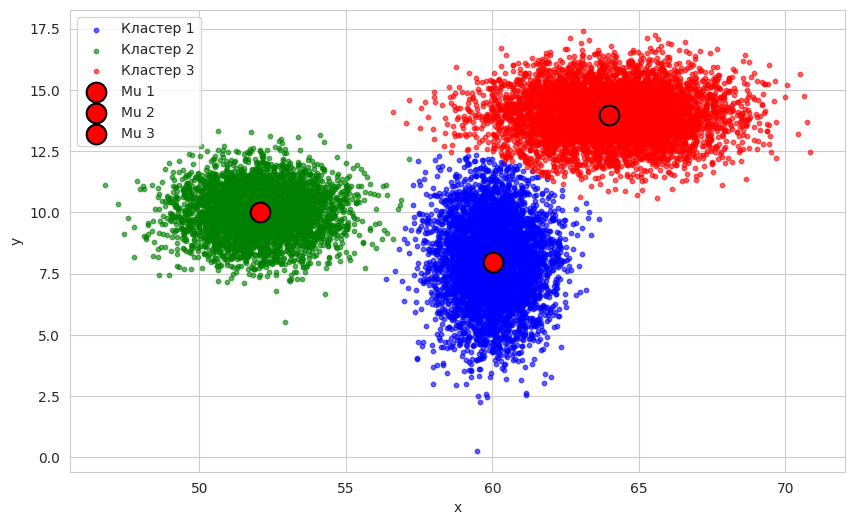

In [ ]:
beautiful_plot(predict, params, ['blue', 'green', 'red'])

#### Пример 3.


Данные для эксперимента.

In [ ]:
params = [
    (np.array([64, 14]), np.diag([4, 1]), 6000),
    (np.array([52, 10]), np.diag([2, 0.9]), 4000),
    (np.array([60, 8]), np.diag([1, 3]), 5000),
    (np.array([50, 2.5]), np.diag([3, 2]), 3000),
    (np.array([70, 5]), np.diag([2, 1]), 8000)
]

generator = GaussianMixtureGenerator(params)
sample = generator.sample()

Запуск EM алгоритма.


In [ ]:
em = GaussianMixtureEM(n_components=5, max_iter=35, random_state=42)
_, predict, params = em.fit(sample, is_log=True)

Вывод результатов.

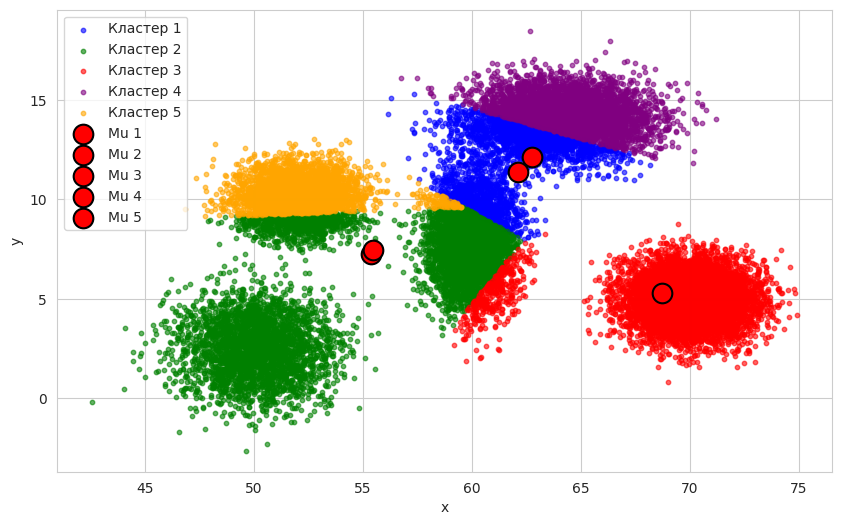

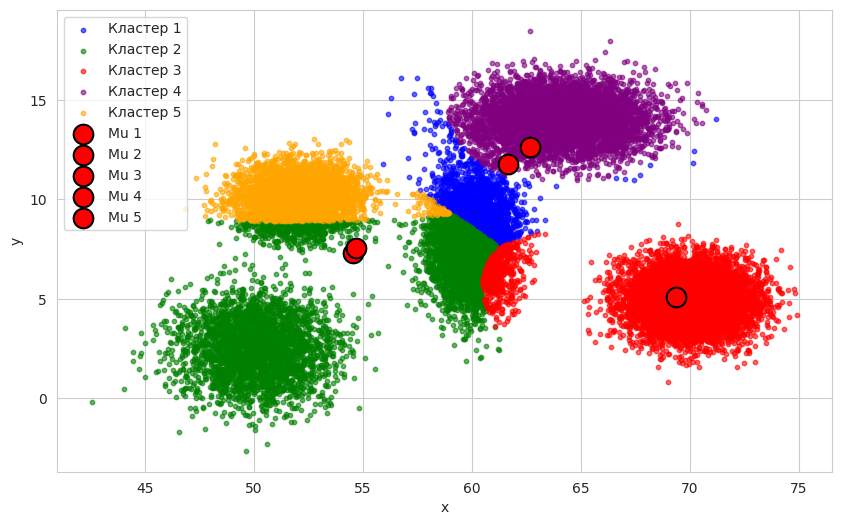

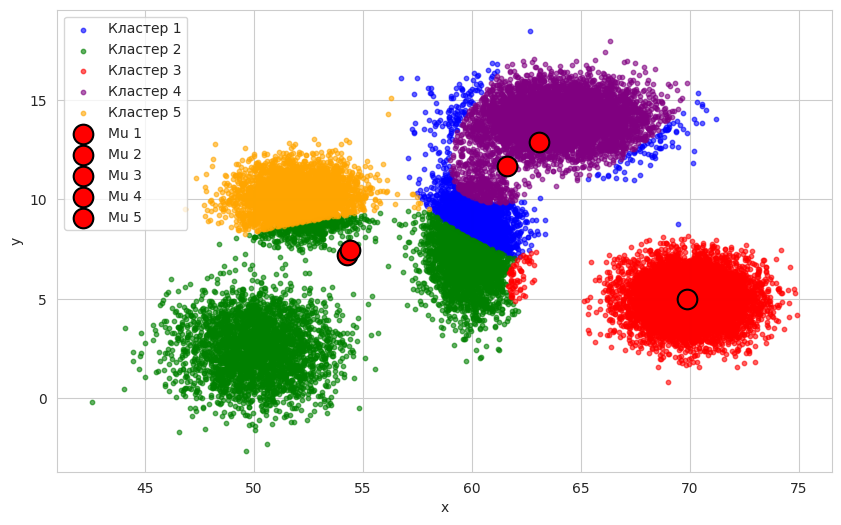

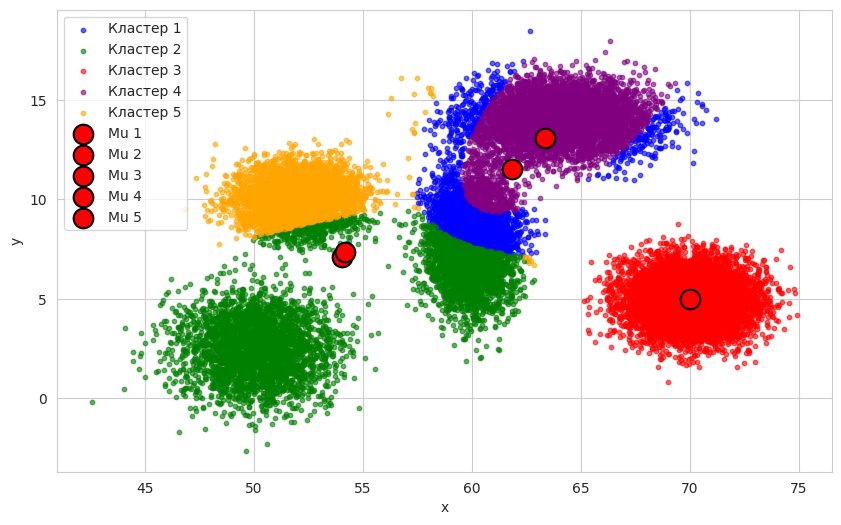

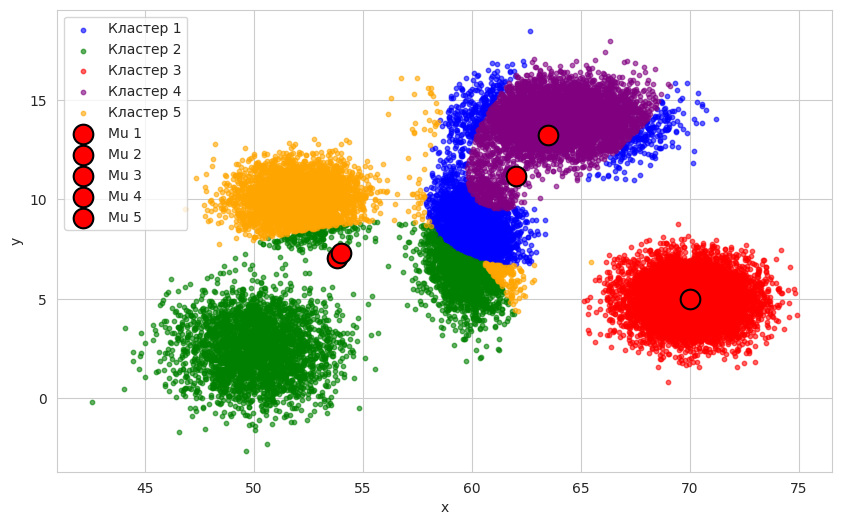

...

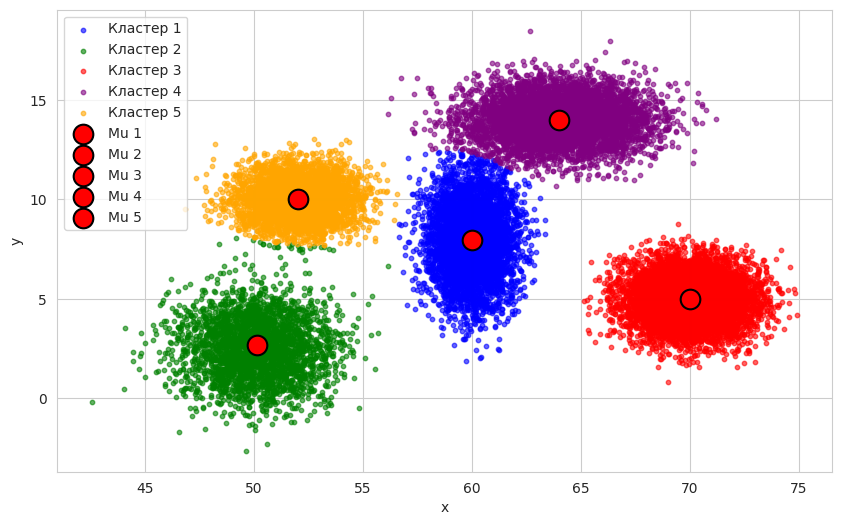

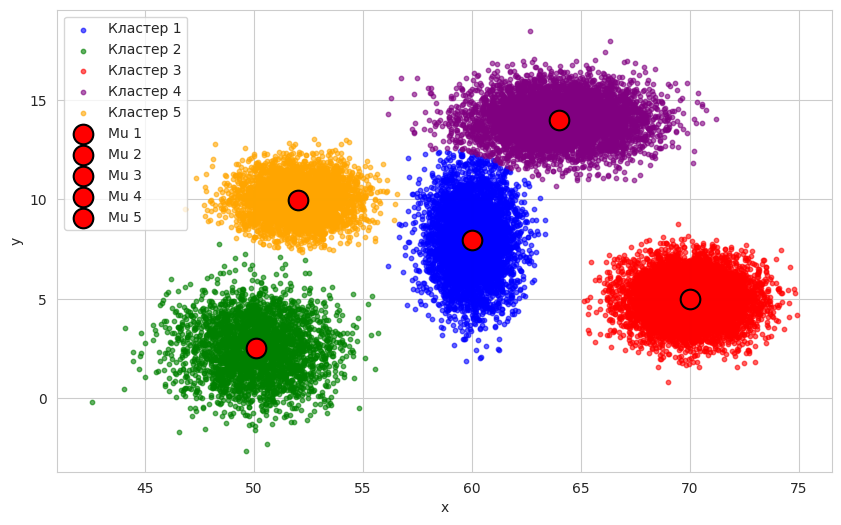

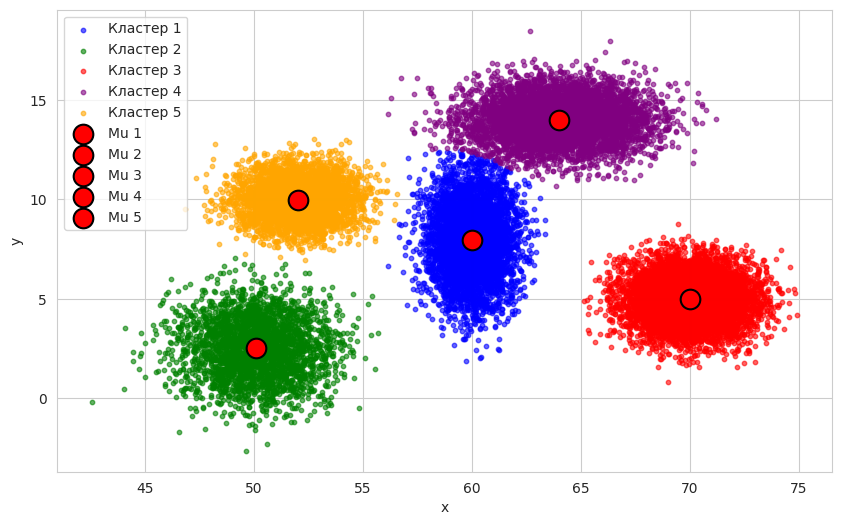

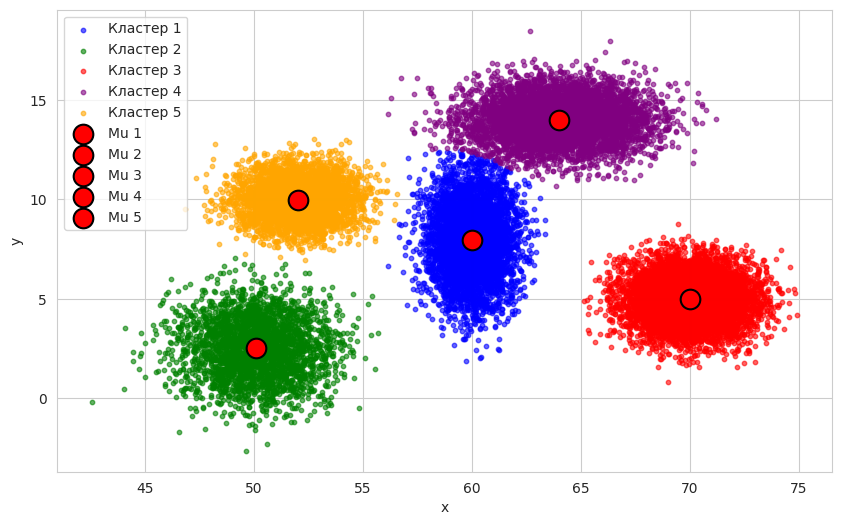

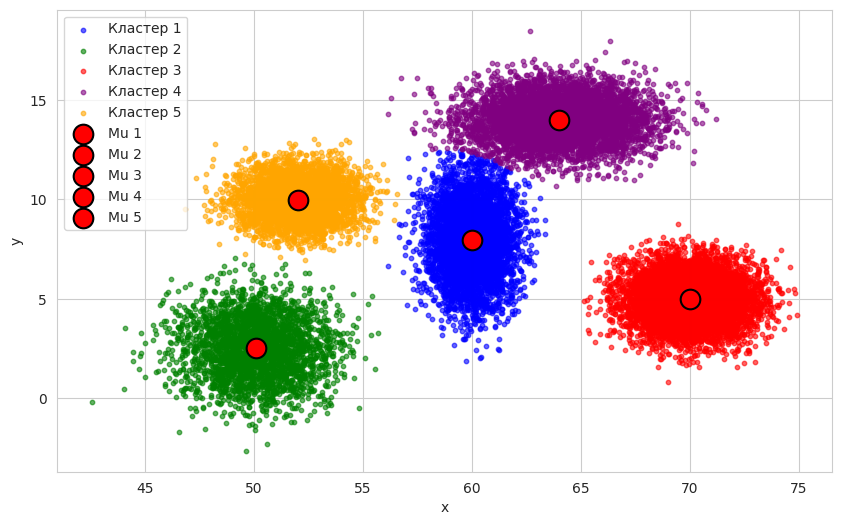

In [ ]:
beautiful_plot(predict, params, ['blue', 'green', 'red', 'purple', 'orange'])

## Generalized EM

In [ ]:
# class GeneralizedEM:
# TODO

## PPCA

http://www.miketipping.com/papers/met-mppca.pdf

**Модель PPCA**:
Пусть у нас есть наблюдения $x_1, x_2, \dots, x_N$ в пространстве размерности $D$. В **Probabilistic PCA** предполагается, что каждое наблюдение $x_i$ является линейной комбинацией скрытой переменной $z_i$ размерности $M$ (где $M < D$) зашумлённой гауссовским шумом:  
$$
x_i = W z_i + \mu + \varepsilon_i, \quad \varepsilon_i \sim \mathcal{N}(0, \sigma^2 I).
$$
Здесь:
- $W$ — матрица проекции $D \times M$ (аналог матрицы главных компонент).
- $z_i \sim \mathcal{N}(0, I)$ — скрытые (латентные) переменные,
- $\varepsilon_i \sim \mathcal{N}(0, \sigma^2 I)$ — гауссовский шум,
- $\mu$ — матожидание (среднее) данных.

**E-шаг (Expectation step)**:

На E-шаге вычисляем **апостериорное распределение** $p(z_i | x_i, W, \sigma^2)$, но в данном случае это необязательно, ведь M-шаг, использует только $\mathbb{E} [z_i]$ и $\mathbb{E} [z_i z_i^T]$.  

$$
\mathbb{E}[z_i] = M^{-1}W^{T}(x_i - \mu)
$$

$$
\mathbb{E}[z_i z_i^T] = \sigma^2 M^{-1} + (\mathbb{E}[z_i]) \cdot (\mathbb{E}[z_i])^T
$$

**M-шаг (Maximization step):**

Максимизируем ожидаемое полное правдоподобие. Нужно обновить параметры $W$ и $\sigma^2$.

$$
W_{\text{new}} = \left( \sum_{i=1}^{N} (x_i - \mu) \mathbb{E}[z_i]^T \right) \left( \sum_{i=1}^{N} \mathbb{E}[z_i z_i^T] \right)^{-1}.
$$
   
$$
\sigma^2_{\text{new}} = \frac{1}{ND} \sum_{i=1}^{N} \left[ ||x_i - \mu||^2 - 2 \mathbb{E}[z_i^T] W_{\text{new}}^T (x_i - \mu) + tr \left( \mathbb{E}[z_i z_i^T](W^T_{\text{new}} W_{\text{new}} \right) \right]
$$

**Итоговый алгоритм:**

Заметим, что E-шаг и M-шаг можно совместить:

$$
S = \frac{1}{N} \sum_{i = 1}^N (x_i - \mu)(x_i - \mu)^T
$$


$$
W_{\text{new}} = S  W [\sigma^2 I + M^{-1} W^T  S  W]^{-1}
$$

$$
\sigma^2_{\text{new}} = \frac{1}{D} tr (S - SWM^{-1}W_{\text{new}}^T)
$$


In [ ]:
class PPCA_EM:
    def __init__(self, n_components, max_iter=100, tol=0.0, random_state=None):
        """
        EM для Probabilistic PCA,
        без хранения полного тензора E[z_i z_i^T] размерности (N, K, K).
        """
        self.n_components = n_components  # число главных компонент (K)
        self.max_iter = max_iter         # макс. число итераций
        self.tol = tol                   # порог сходимости по log-likelihood
        self.random_state = random_state # для воспроизводимости

        self.W = None       # (D, K) - матрица проекции
        self.sigma2 = None  # дисперсия шума
        self.mu = None      # (D,)    - среднее данных

    def _initialize_parameters(self, X):
        """
        Инициализация W и sigma2 случайным образом (без SVD),
        чтобы избежать больших временных затрат при высокой размерности.
        """
        np.random.seed(self.random_state)
        N, D = X.shape
        K = self.n_components

        # Среднее
        self.mu = np.mean(X, axis=0)

        # Случайная инициализация матрицы W (маленькие значения)
        # Можно подбирать коэффициент (0.01) под задачу.
        self.W = 0.01 * np.random.randn(D, K)

        # Инициализация дисперсии шума как некоторая доля дисперсии данных
        self.sigma2 = 0.1 * np.var(X)

    def _E_step(self, X):
        """
        E-шаг: вычисляем Ez, Ez_sum2 и M_inv.
        """
        N, D = X.shape
        K = self.n_components
        X_centered = X - self.mu

        M = self.W.T @ self.W + self.sigma2 * np.eye(K)
        M_inv = np.linalg.solve(M, np.eye(K))  # Более стабильное обращение

        Ez = (X_centered @ self.W) @ M_inv
        Ez_sum2 = Ez.T @ Ez + self.sigma2 * N * M_inv

        return Ez, Ez_sum2, M_inv

    def _M_step(self, X, Ez, Ez_sum2):
        """
        M-шаг: обновляем W и sigma2, используя суммарные матрицы.
        """
        N, D = X.shape
        X_centered = X - self.mu

        # Обновляем W
        # W_new = (X_centered^T Ez) (Ez_sum2^-1)
        W_new = np.linalg.solve(Ez_sum2, (X_centered.T @ Ez).T).T

        # Обновляем sigma^2
        # sigma2_new = 1/(N*D) sum_i ||x_i - W_new z_i||^2
        residual = X_centered - Ez @ W_new.T
        sigma2_new = np.sum(residual**2) / (N * D)

        return W_new, sigma2_new

    def fit(self, X):
        """
        Обучение PPCA через EM.
        """
        if X.ndim == 1:
            X = X.reshape(-1, 1)

        self._initialize_parameters(X)
        prev_ll = -np.inf

        for _ in range(self.max_iter):
            # E-шаг
            Ez, Ez_sum2, M_inv = self._E_step(X)
            # M-шаг
            W_new, sigma2_new = self._M_step(X, Ez, Ez_sum2)

            # Оценка log-likelihood (упрощенная):
            # log p(X|theta) ~ - N*D/2 * log(sigma2)
            N, D = X.shape
            ll = -0.5 * N * D * np.log(sigma2_new + 1e-12)

            # Проверка сходимости
            if np.abs(ll - prev_ll) < self.tol:
                break
            prev_ll = ll

            self.W = W_new
            self.sigma2 = sigma2_new

        return self

    def transform(self, X):
        """
        Проецирует X в пространство главных компонент (K).
        """
        if X.ndim == 1:
            X = X.reshape(-1, 1)
        X_centered = X - self.mu

        M = self.W.T @ self.W + self.sigma2 * np.eye(self.n_components)
        Ez = np.linalg.solve(M, (X_centered @ self.W).T).T

        return Ez

    def inverse_transform(self, Z):
        """
        Обратно проецирует Z в исходное пространство (D).
        """
        return Z @ self.W.T + self.mu

    def fit_transform(self, X):
        """
        fit + transform: обучает PPCA и возвращает координаты в скрытом пространстве.
        """
        self.fit(X)
        return self.transform(X)

### Сравним работу алгоритмов на изображении большого качества.

In [ ]:
class ImageCompressor:
    def __init__(self, pca_algo, **params):
        self.pca_algo = pca_algo
        self.params = params
        self.compressed_image = None

    def fit_transform(self, image):
        h, w = image.shape

        model = self.pca_algo(**self.params)
        pca_image = model.fit_transform(image)
        self.compressed_image = model.inverse_transform(pca_image)

        return self.compressed_image

    def error(self, image):
        return np.mean((image - self.compressed_image) ** 2)

Загрузка данных.

In [ ]:
import cv2

image_path = "big_image.jpg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
h, w = image.shape  # Запоминаем размеры
h, w

(3935, 5903)

Подготовка алгоритмов сжатия.

In [ ]:
components_list = np.logspace(1, 3, 10, dtype=int)

pca_compressor = [ImageCompressor(PCA, n_components=k, tol=0.0, random_state=42) for k in components_list]
ppca_compressor = [ImageCompressor(PPCA_EM, n_components=k, max_iter=100, tol=0.0, random_state=42) for k in components_list]

Сжатие изображении.

In [ ]:
for i, k in tqdm(enumerate(components_list)):
    pca_compressor[i].fit_transform(image)
    ppca_compressor[i].fit_transform(image)

pca_errors = [compressor.error(image) for compressor in pca_compressor]
ppca_errors = [compressor.error(image) for compressor in ppca_compressor]

10it [34:50, 209.04s/it]



Сжатие изображения через `PCA`.


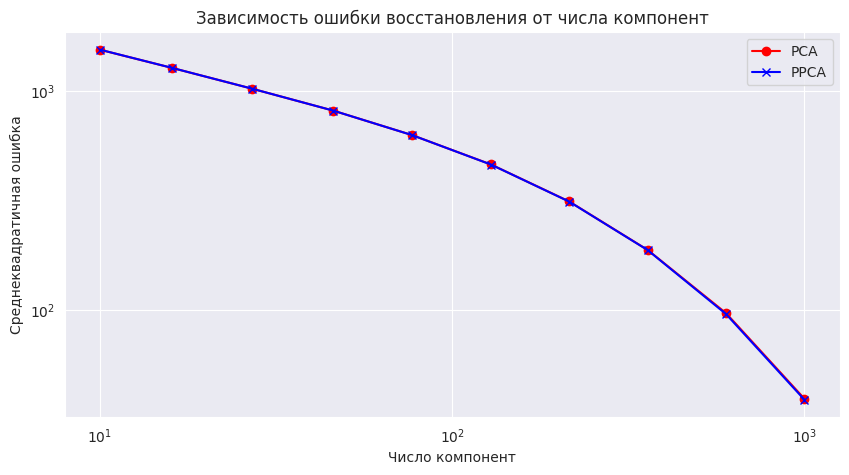

In [ ]:
with sns.axes_style("darkgrid"):
    # График ошибки
    plt.figure(figsize=(10, 5))

    plt.plot(components_list, pca_errors, marker='o', color='red', label='PCA')
    plt.plot(components_list, ppca_errors, marker='x', color='blue', label='PPCA')

    plt.yscale('log')
    plt.xscale('log')

    plt.xlabel('Число компонент')
    plt.ylabel('Среднеквадратичная ошибка')
    plt.title('Зависимость ошибки восстановления от числа компонент')

    plt.legend()
    plt.show()

Визуализация оригиналов и восстановленных картинок.


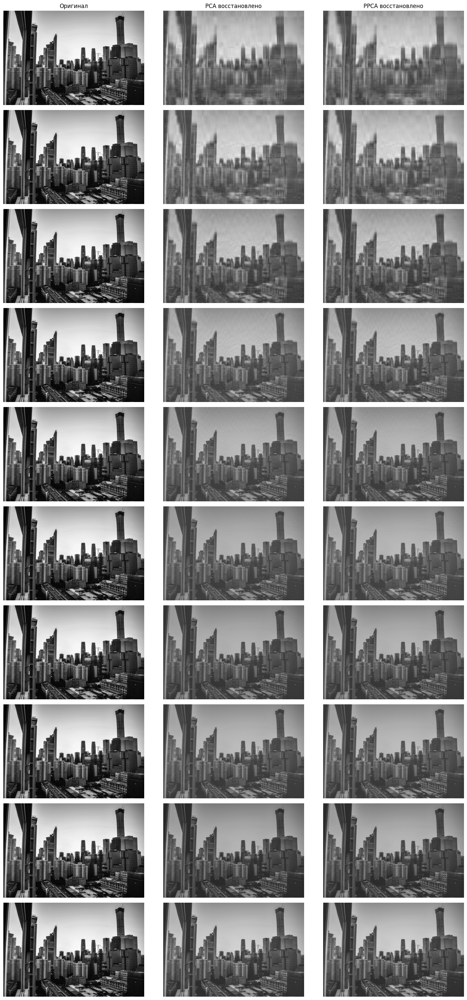

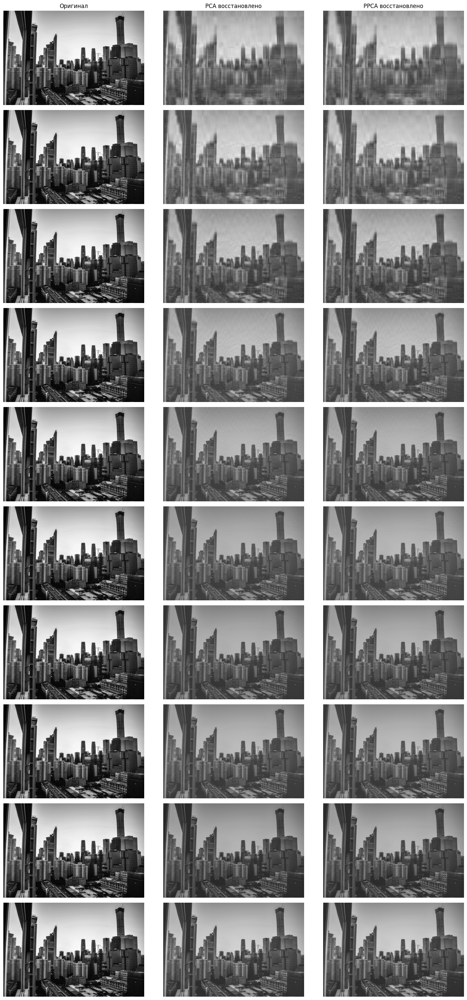

In [ ]:
n_display = len(components_list)
fig, axes = plt.subplots(n_display, 3, figsize=(15, 30))

for i in range(n_display):
    axes[i, 0].imshow(image, cmap='gray')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(pca_compressor[i].compressed_image, cmap='gray')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(ppca_compressor[i].compressed_image, cmap='gray')
    axes[i, 2].axis('off')

axes[0, 0].set_title("Оригинал")
axes[0, 1].set_title("PCA восстановлено")
axes[0, 2].set_title("PPCA восстановлено")

plt.tight_layout()
plt.show()